In [3]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import glob, os
from scipy import misc
from scipy.misc import imresize
import pickle
import matplotlib.image as mpimg
%matplotlib inline  

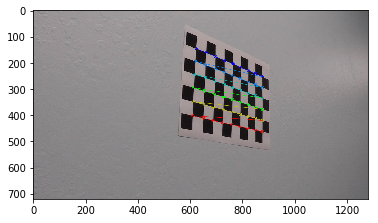

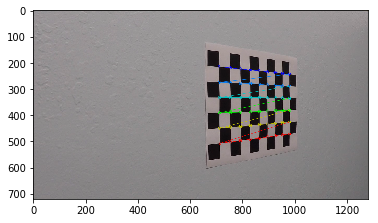

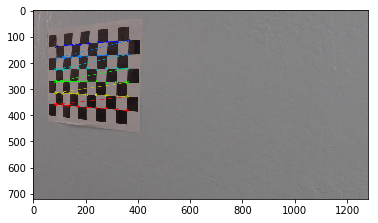

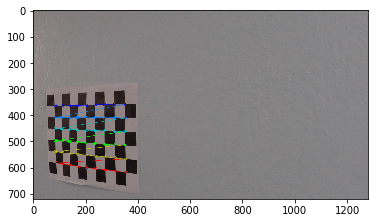

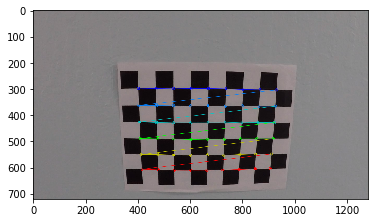

...

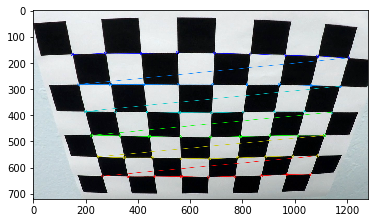

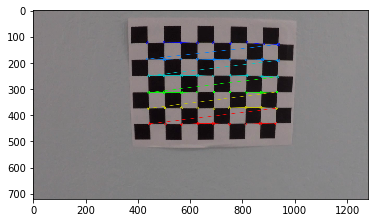

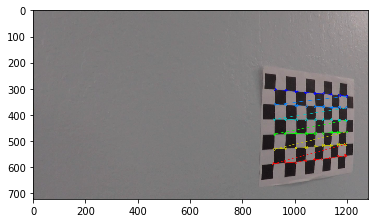

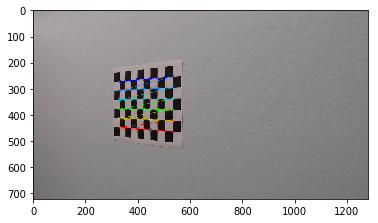

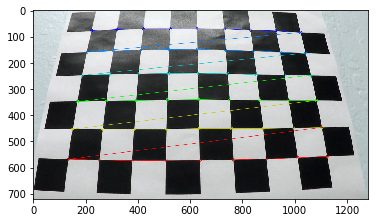

In [8]:
nx = 9
ny = 6

#Initialize an array with zeros 
objp = np.zeros((nx*ny,3), np.float32)

#Create coordinates for object points
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space, coordinates of the chessboard corners 
imgpoints = [] # 2d points in image plane, coordinates of the chessboard corners 

# Make a list of calibration images
images = glob.glob('camera_cal/*.jpg')


for idx, image in enumerate(images):
    img = cv2.imread(image)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        img = cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        plt.imshow(img)
    plt.show()
        
# Test undistortion on an image
img = cv2.imread('camera_cal/calibration1.jpg')
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
#img_size = (img.shape[1], img.shape[0])


# Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1],None,None)


dst = cv2.undistort(img, mtx, dist, None, mtx)
cv2.imwrite('undistortion/calibration1.jpg',dst)

# Save the camera calibration result
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "calibration/dist_pickle.p", "wb" ) )



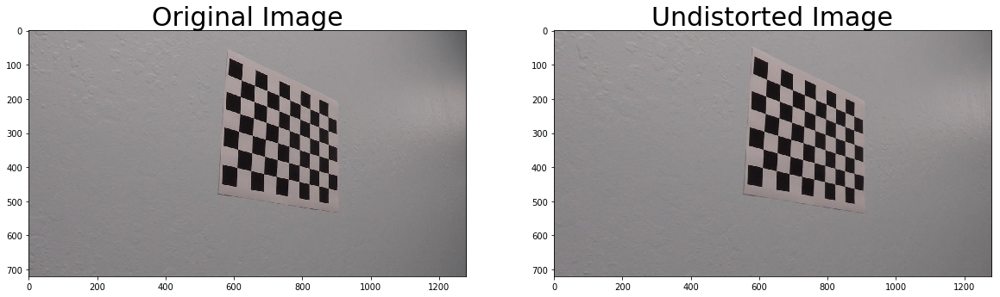

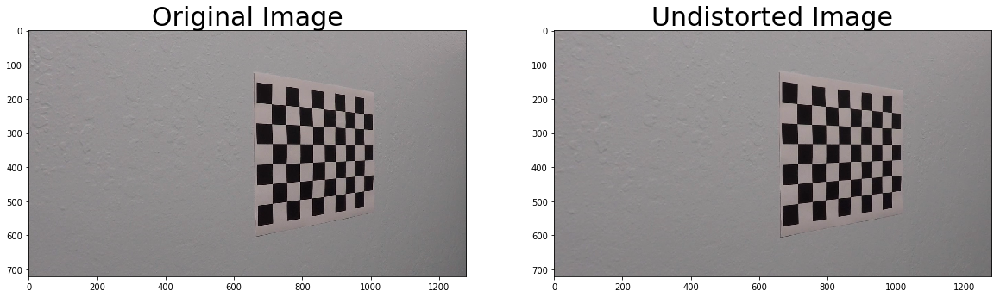

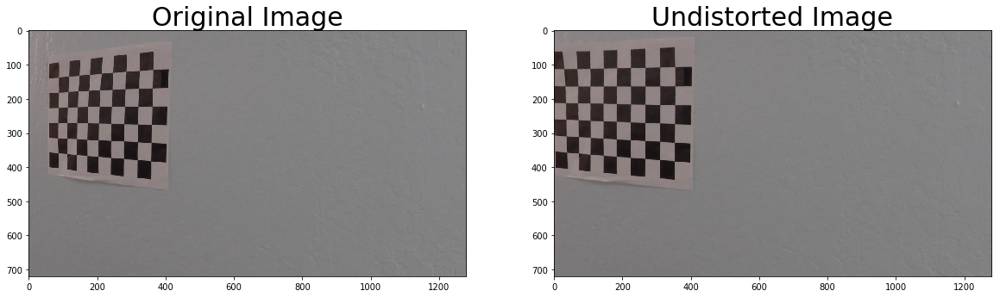

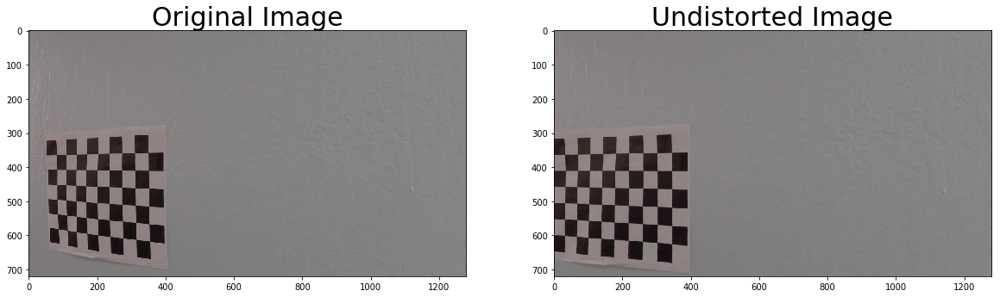

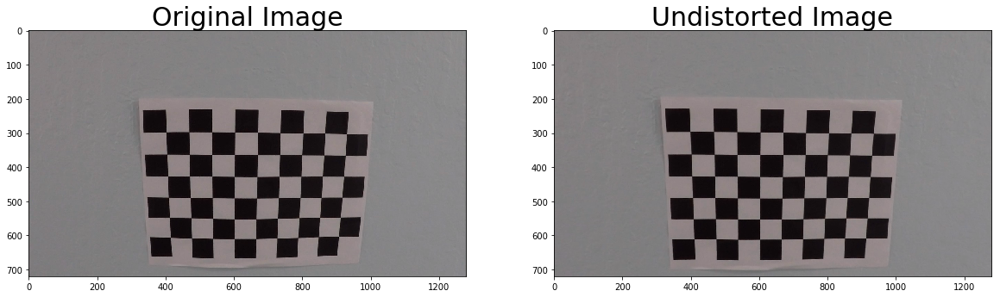

...

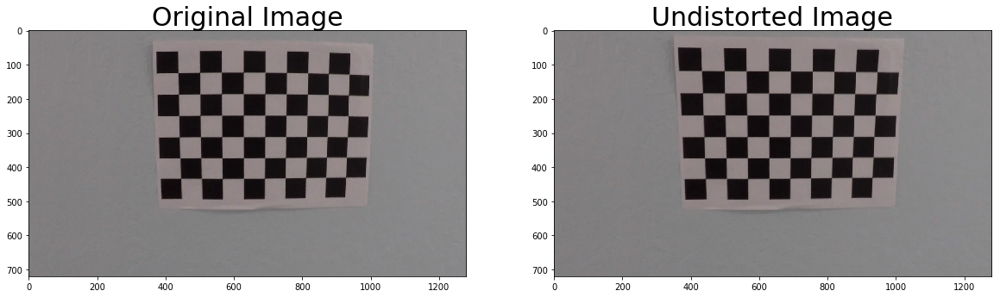

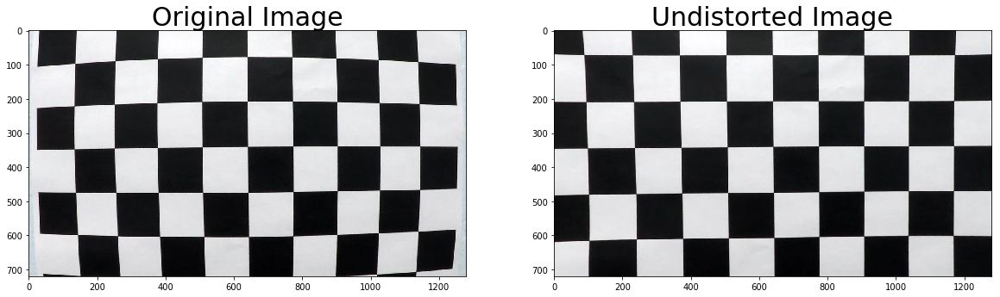

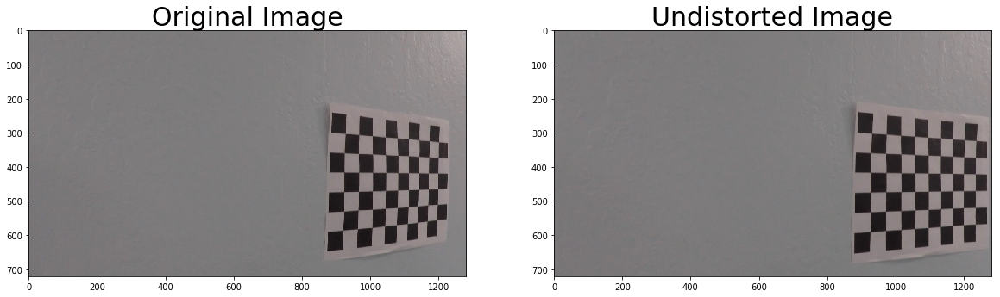

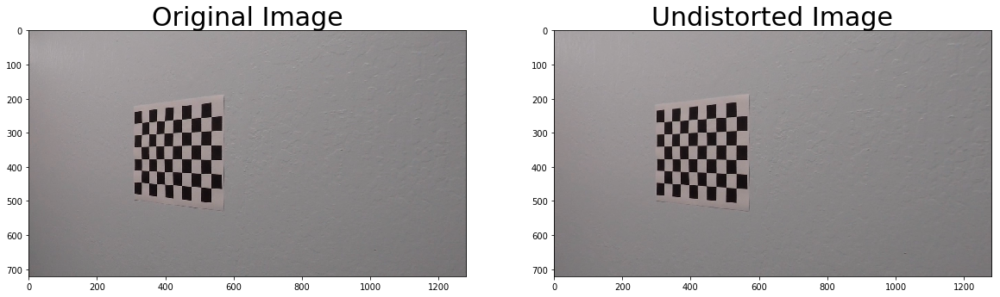

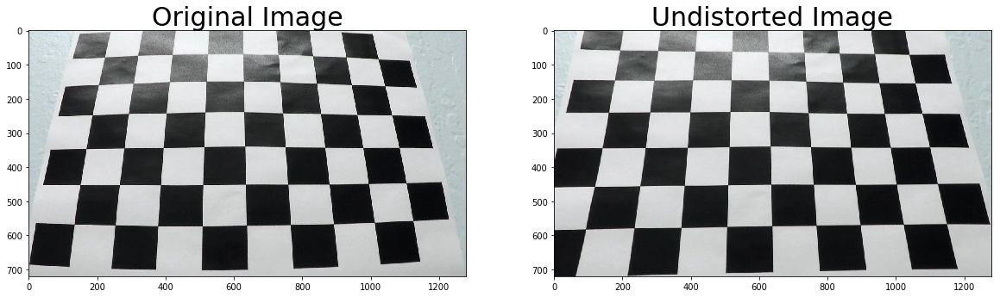

In [9]:
# Test undistortion on an image
images = glob.glob('camera_cal/*.jpg')

for idx, image in enumerate(images):
    img = cv2.imread(image)
    img_size = (img.shape[1], img.shape[0])
    # Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
    
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    cv2.imwrite('undistortion/calibration'+str(idx)+'.jpg',dst)
    

    # Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
    dist_pickle = {}
    dist_pickle["mtx"] = mtx
    dist_pickle["dist"] = dist
    pickle.dump( dist_pickle, open( "calibration/dist_pickle.p", "wb" ) )
    #dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)

    # Visualize undistortion
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(dst)
    ax2.set_title('Undistorted Image', fontsize=30)